# Pokemon Classification - Image Recognition vs AutoEncoder
Compare between normal convolution network for image classification compared to using AutoEncoder, followed by computing its Clustering.

In [ ]:
%pip install -q imageio pydot tensorflow-gpu==2.9.3 keras matplotlib graphviz moviepy

In [2]:
import os
import keras_tuner as kt
from numpy import asarray
from IPython.display import Image
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import os.path
import imageio.v2 as imageio
import glob
from skimage.color import lab2rgb
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier


/media/programming/projects/machineLearning/ML/venv/lib/python3.8/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn(


## Import all Modules and Configure GPU

In [3]:
#os.environ["CUDA_VISIBLE_DEVICES"]="-1"  # Debug only
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import mixed_precision
import tensorflow_io as tfio

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Enable float16 bit for improved performance.
        #mixed_precision.set_global_policy('mixed_float16')
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Initialize tf.distribute.MirroredStrategy
strategy = tf.distribute.MirroredStrategy(devices=None)
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

2023-03-28 19:10:01.653803: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 19:10:01.676771: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 19:10:01.676939: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Number of devices: 1


2023-03-28 19:10:01.678038: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-28 19:10:01.679294: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 19:10:01.679439: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 19:10:01.679559: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

In [4]:
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.9.3


### Configure Output Directory
Set the output directory where all the results will be storaged.

In [5]:
root_dir = "result/pokemon_image_classification_vs_dim_reduction"
if not os.path.exists(root_dir):
    os.mkdir(root_dir)

## Load DataSet

In [6]:
def load_from_directory(data_dir, image_size, batch_size, train_size=0.8):
    def configure_for_performance(ds, AUTOTUNE, shuffleSize):
        #ds = ds.cache(filename='/tmp/pokemonCache', name='pokemonCache')
        #ds = ds.cache()
        if shuffleSize > 0:
            ds = ds.shuffle(buffer_size=shuffleSize, reshuffle_each_iteration=False)
        ds = ds.prefetch(buffer_size=AUTOTUNE)

        return ds

    data_train_dir = pathlib.Path(data_dir)
    train_ds = tf.keras.utils.image_dataset_from_directory(
        data_train_dir,
        interpolation='bilinear',
        color_mode='rgb',
        label_mode='int',
        follow_links=True,
        shuffle=True,
        image_size=image_size,
        batch_size=batch_size)
    #
    AUTOTUNE = tf.data.AUTOTUNE
    normalization_layer = tf.keras.layers.Rescaling(1.0 / 255.0)

    class_names = train_ds.class_names

    @tf.function
    def preprocess_lab2(img):
        image = tf.cast(img, tf.float32)
        return tfio.experimental.color.rgb_to_lab(image)

    nrBatches = len(train_ds)

    # Translate [0,255] -> [-1, 1]
    normalized_train_ds = (train_ds.map(lambda x, y: (preprocess_lab2(normalization_layer(x)) * (1.0 / 128.0), y)))

    final_normalized_train_ds = normalized_train_ds.take(int(train_size * nrBatches))

    offset_skip = int(train_size * nrBatches)
    validation_nr_batchs = int((1.0 - train_size) * nrBatches)
    normalized_test_ds = normalized_train_ds.skip(offset_skip).take(validation_nr_batchs)

    return configure_for_performance(final_normalized_train_ds, AUTOTUNE, 0), configure_for_performance(normalized_test_ds, AUTOTUNE, 0), class_names


In [7]:
BATCH_SIZE = 8
IMAGE_SIZE = (128, 128)
EPOCHS = 24

data_directory_path = "PokemonData/"
data_dir = pathlib.Path(data_directory_path)

train_images, validation_images, classes = load_from_directory(data_dir, IMAGE_SIZE, BATCH_SIZE, 0.9)

print("Train: Number of batches {0} of {1} elements".format(
    len(train_images), BATCH_SIZE))

print("Validation: Number of batches {0} of {1} elements".format(
    len(train_images), BATCH_SIZE))


Found 6820 files belonging to 150 classes.
Train: Number of batches 767 of 8 elements
Validation: Number of batches 767 of 8 elements


## Augment DataSet
By augmenting the image, it can reduce overfitting since no image will be the same between each epoch.

In [8]:
trainAug = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomZoom(
        height_factor=(-0.05, -0.15),
        width_factor=(-0.05, -0.15)),
    layers.RandomRotation(0.3)
])

def augmentFunc(x, y):
    aX = trainAug(x)
    return (aX, aX)

def augmentClass(x, y):
    aX = trainAug(x)
    return (aX, y)

# None Augmented Version
trainAugmentedClassificationDS = (
    train_images
    .map(augmentClass,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)
validateAugmentedClassificationDS = (
    validation_images
    .map(augmentClass,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

# Augmented Version
trainAugmentedAEDS = (
    train_images
    .map(augmentFunc,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)
validateAugmentedAEDS = (
    validation_images
    .map(augmentFunc,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)


# Example Data

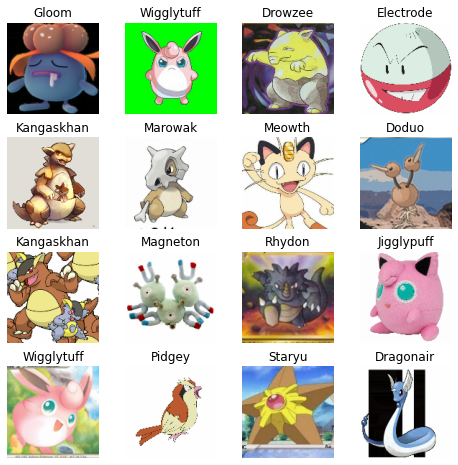

In [9]:
batch_iter = iter(train_images)
image_batch, expected_batch = next(batch_iter)

nrCol = 16
plt.figure(figsize=(4 * 2, 4 * 2))
for i in range(0, nrCol):

    trainImage, expected = (image_batch[i % len(image_batch)], expected_batch[i % len(expected_batch)])  # (images + 1.0) / 2.0
    trainImage = lab2rgb(trainImage * 128.0)

    ax = plt.subplot(4, 4, i + 1)
    plt.title(label=str.format("{0}", classes[expected]))
    plt.imshow(asarray(trainImage).astype(dtype='float32'))
    plt.axis("off")

    if (i + 1) % len(image_batch) == 0:
        image_batch, expected_batch = next(batch_iter)
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()


## Augmented

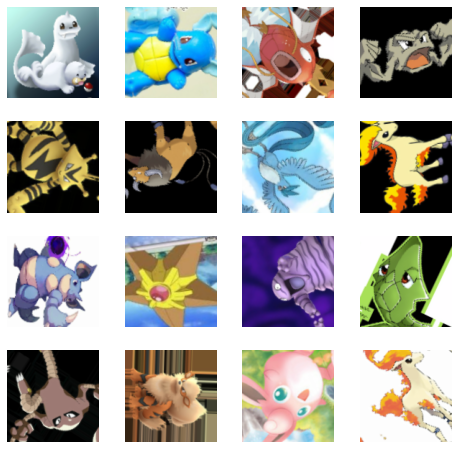

In [10]:
batch_iter = iter(trainAugmentedAEDS)
image_batch, expected_batch = next(batch_iter)

nrCol = 16
plt.figure(figsize=(4 * 2, 4 * 2))
for i in range(0, nrCol):

    trainImage, expected = (image_batch[i % len(image_batch)], expected_batch[i % len(expected_batch)])  # (images + 1.0) / 2.0
    trainImage = lab2rgb(trainImage * 128.0)

    ax = plt.subplot(4, 4, i + 1)

    plt.imshow(asarray(trainImage).astype(dtype='float32'))
    plt.axis("off")

    if (i + 1) % len(image_batch) == 0:
        image_batch, expected_batch = next(batch_iter)
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()


## Create Image Classification

In [11]:

def generate_cnn_builder(hp, input, output):
    activation_dict = {
        'leaky_relu': layers.LeakyReLU(alpha=0.2, dtype='float32'),
        'relu': layers.ReLU(dtype='float32')
    }

    kernel_activation = hp.Choice('kernel_activation', ['relu', 'leaky_relu'])

    #
    kernel_init = hp.Choice('kernel_initializer', ['uniform', 'lecun_uniform', 'normal', 'zero',
                                                   'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform'])

    batch_norm = hp.Boolean('batch_norm')
   # use_resnet = hp.Boolean('use_resnet')

    max_pooling = hp.Boolean('max_pooling')
    hp_kernel_filter_size_l1 = hp.Int('kernel_filter', min_value=4, max_value=6, step=1)
    kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=1)

    number_layers = hp.Int(
        'number_layers', min_value=3, max_value=4, step=1)

    model = tf.keras.Sequential()

    max_filters_size = 1024

    for i in range(0, number_layers):
        filter_size = (2 ** (hp_kernel_filter_size_l1 + i))
        filter_size = min(max_filters_size, filter_size)

        model.add(
            layers.Conv2D(filters=filter_size, kernel_size=kernel_size, strides=(1, 1), kernel_initializer=kernel_init))
        model.add(activation_dict[kernel_activation])
        if batch_norm:
            model.add(layers.BatchNormalization(dtype='float32'))

        if max_pooling:
            model.add(layers.MaxPooling2D(pool_size=(2, 2)))
        else:
            model.add(
                layers.Conv2D(filters=filter_size, kernel_size=kernel_size, kernel_initializer=kernel_init, strides=(2, 2)))
            model.add(activation_dict[kernel_activation])
            if batch_norm:
                model.add(layers.BatchNormalization(dtype='float32'))

    model.add(layers.Flatten())

    hp_units = hp.Int('dense0_units', min_value=160, max_value=512, step=32)
    model.add(layers.Dense(units=hp_units, kernel_initializer=kernel_init))
    model.add(activation_dict[kernel_activation])
    if batch_norm:
        model.add(layers.BatchNormalization(dtype='float32'))

    model.add(layers.Dense(output))

    hp_optimizer = hp.Choice('optimizer', ['adam', 'sgd', 'rmsprop'])

    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    optimizer = tf.keras.optimizers.get(hp_optimizer)
    optimizer.learning_rate = hp_learning_rate

    model.compile(optimizer=optimizer,
                  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

    return model


## 

In [12]:
# Neuron network input and output.
num_classes_output = len(classes)

def model_builder(hp):
    model = generate_cnn_builder(hp, (IMAGE_SIZE[0], IMAGE_SIZE[1], 3), num_classes_output)
    return model

tuner = kt.Hyperband(model_builder,
                     objective='val_accuracy',
                     max_epochs=16,
                     factor=3,
                     directory=os.path.join(root_dir, 'cache'),
                     project_name='Pokemon_Image_Classification')

stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5)

tuner.search(trainAugmentedClassificationDS, epochs=EPOCHS, batch_size=BATCH_SIZE,
             validation_data=validateAugmentedClassificationDS,
             callbacks=[stop_early, tf.keras.callbacks.TerminateOnNaN()], verbose=1)

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

pokemon_classification_model = tuner.hypermodel.build(best_hps)


Trial 30 Complete [00h 02m 04s]
val_accuracy: 0.30441176891326904

Best val_accuracy So Far: 0.3867647051811218
Total elapsed time: 00h 27m 12s
INFO:tensorflow:Oracle triggered exit


In [ ]:
EPOCHS = 192

checkpoint_path = os.path.join(root_dir, 'checkpoints/pokemon_classification.ckpt')

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=0)

checkpoint = tf.train.Checkpoint(model=pokemon_classification_model)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_path)).expect_partial()

# The model weights (that are considered the best) are loaded into the model.
if os.path.exists(checkpoint_path):
    pokemon_classification_model.load_weights(checkpoint_path)


pokemon_classification_result = pokemon_classification_model.fit(trainAugmentedClassificationDS, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validateAugmentedClassificationDS,
                                                                 callbacks=[cp_callback])

pokemon_classification_model.save_weights(checkpoint_path)

#
pokemon_classification_model_filename = 'pokemon-classification.h5'
pokemon_classification_model.save(os.path.join(root_dir, pokemon_classification_model_filename))

In [14]:
pokemon_classification_model = tf.keras.models.load_model(os.path.join(root_dir, pokemon_classification_model_filename))

# Classiciation Result

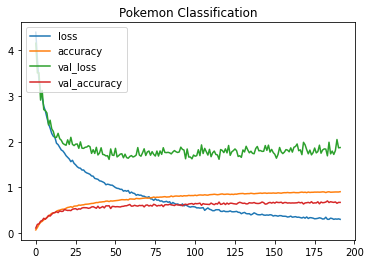

<Figure size 432x288 with 0 Axes>

In [15]:
def plotCostHistory(history, loss_label="", val_label="", title="", x_label="", y_label=""):
    plt.figure()
    for k, v in history.items():
        plt.plot(v, label=k)
    plt.title(label=title)
    plt.ylabel(ylabel=y_label)
    plt.xlabel(xlabel=x_label)
    plt.legend(loc="upper left")
    plt.show()
    plt.savefig(title + ".png")


plotCostHistory(pokemon_classification_result.history, title='Pokemon Classification')


## Create AutoEncoder

In [34]:
def model_constructor(hp, latent_space, image_size):

    class Autoencoder(keras.Model):
        def __init__(self, hp, **kwargs):
            super(Autoencoder, self).__init__(**kwargs)

            activation_dict = {
                'leaky_relu': layers.LeakyReLU(alpha=0.2, dtype='float32'),
                'relu': layers.ReLU(dtype='float32')
            }

            batch_norm = hp.Boolean('batch_norm')
            use_upscale = hp.Boolean('Upscale')
            #use_resnet = hp.Boolean('use_resnet')

            kernel_init = hp.Choice('kernel_initializer', ['uniform', 'lecun_uniform', 'normal', 'zero',
                                                           'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform'])
            kernel_activation = hp.Choice('kernel_activation', ['relu', 'leaky_relu'])

            hp_kernel_filter_size_l1 = hp.Int('kernel_filter', min_value=7, max_value=9, step=1)
            hp_kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=1)
            num_downscale = hp.Int('num_downscale', min_value=1, max_value=2, step=1)

            number_layers = hp.Int(
                'number_layers', min_value=2, max_value=3, step=1)

            regularization = hp.Int(
                'regularization', min_value=4, max_value=5, step=1)

            self.encoder = tf.keras.Sequential(name="Encoder")
            self.encoder.add(layers.Input(image_size))

            encoder_last_conv2 = None

            for i in range(0, number_layers):
                filter_size = 2 ** (hp_kernel_filter_size_l1 - i)

                for j in range(0, num_downscale):
                    self.encoder.add(layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                                   padding='same', strides=(2, 2), kernel_initializer=kernel_init))
                    if batch_norm:
                        self.encoder.add(layers.BatchNormalization(dtype='float32'))
                    self.encoder.add(activation_dict[kernel_activation])

                #
                encoder_last_conv2 = layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                                   strides=(1, 1), padding='same', kernel_initializer=kernel_init)
                self.encoder.add(encoder_last_conv2)
                if batch_norm:
                    self.encoder.add(layers.BatchNormalization(dtype='float32'))
                self.encoder.add(activation_dict[kernel_activation])

            connect_conv_shape = encoder_last_conv2.output_shape

            # Flatten to connect to forward neuron.
            self.encoder.add(layers.Flatten())

            # For adding sparse, for improve of thing with small variance.
            self.encoder.add(layers.Dense(units=latent_space, activation=None, bias_initializer=None, kernel_initializer=None,
                             activity_regularizer=keras.regularizers.L1(10 ** -regularization), dtype='float32', name="latentspace"))

            # Create decoder.
            self.decoder = tf.keras.Sequential(name="Decoder")

            self.decoder.add(layers.Dense(units=(connect_conv_shape[1] * connect_conv_shape[2] * connect_conv_shape[3]),
                             activation=None, bias_initializer=None, kernel_initializer=None, dtype='float32'))

            self.decoder.add(layers.Reshape(target_shape=(
                connect_conv_shape[1], connect_conv_shape[2], connect_conv_shape[3])))

            for i in range(0, number_layers):
                filter_size = 2 ** ((hp_kernel_filter_size_l1 - number_layers) + i + 1)

                self.decoder.add(layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                 strides=(1, 1), padding='same', kernel_initializer=kernel_init))
                if batch_norm:
                    self.decoder.add(layers.BatchNormalization(dtype='float32'))
                self.decoder.add(activation_dict[kernel_activation])

                for j in range(0, num_downscale):
                    if use_upscale:
                        self.decoder.add(layers.UpSampling2D(size=(2, 2)))
                    else:
                        self.decoder.add(layers.Conv2DTranspose(filters=filter_size, kernel_size=hp_kernel_size,
                                                                padding='same', strides=(2, 2), kernel_initializer=kernel_init))
                        if batch_norm:
                            self.decoder.add(layers.BatchNormalization(dtype='float32'))
                        self.decoder.add(activation_dict[kernel_activation])

            self.decoder.add(layers.Conv2D(filters=3, kernel_size=(3, 3), padding='same', kernel_initializer=kernel_init))
            if batch_norm:
                self.decoder.add(layers.BatchNormalization(dtype='float32'))
            self.decoder.add(layers.Activation(activation='tanh', dtype='float32'))

        def call(self, x):
            encoded = self.encoder(x)
            decoded = self.decoder(encoded)
            return decoded

        def getEncoder(self):
            return self.encoder

        def getDecoder(self):
            return self.decoder

        def getModel(self):
            ae_input = layers.Input(shape=image_size, name="AE_input")
            ae_encoder_output = self.getEncoder()(ae_input)
            ae_decoder_output = self.getDecoder()(ae_encoder_output)

            return keras.Model(inputs=ae_input, outputs=ae_decoder_output)

        def compile(self, **kwargs):
            super(Autoencoder, self).compile(**kwargs)

        def summary(self, **kwargs):
            super(Autoencoder, self).summary(**kwargs)
            self.encoder.summary()

    def ssim_loss(y_true, y_pred):
        return 1.0 * (1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0))) + 0.2 * tf.keras.losses.mean_squared_error(y_true, y_pred)

    autoencoder = Autoencoder(hp)
    hp_optimizer = hp.Choice('optimizer', ['sgd', 'adam', 'rmsprop', 'ssim'])
    hp_learning_rate = hp.Choice('learning_rate', values=[2e-2, 2e-3, 2e-4])

    hp_loss = hp.Choice('loss', ['mse', 'binary_crossentropy'])

    if hp_optimizer == 'ssim':
        optimizer = ssim_loss
    else:
        optimizer = tf.keras.optimizers.get(hp_optimizer)
    optimizer.learning_rate = hp_learning_rate

    model = autoencoder.getModel()
    model.compile(optimizer=optimizer, loss=hp_loss, metrics=['accuracy'])
    model.summary()
    model.layers[1].summary()
    model.layers[2].summary()

    return model


## Hyperparameter
Find the best model out of all the parameters.

In [38]:
def showResult(model, batchImage, maxNumImages=6):
    output = model.predict(batchImage)

    nrElements = min(len(output), maxNumImages)

    batch_iter = iter(batchImage)
    image_batch, _ = next(batch_iter)

    fig = plt.figure(figsize=(maxNumImages * 2, 2 * 2))
    for i in range(nrElements):

        ax = plt.subplot(2, maxNumImages, i + 1)
        plt.imshow((asarray(lab2rgb(image_batch[i % len(image_batch)] * 128)).astype(dtype='float32')))
        plt.axis("off")

        ax = plt.subplot(2, maxNumImages, maxNumImages + i + 1)
        plt.imshow((asarray(lab2rgb(output[i] * 128)).astype(dtype='float32')))
        plt.axis("off")

        if (i + 1) % len(image_batch) == 0:
            image_batch, _ = next(batch_iter)

    fig.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.close()
    return fig


class save_images(tf.keras.callbacks.Callback):

    def __init__(self, dir_path, latent_space, trainData, **kwargs):
        super(tf.keras.callbacks.Callback, self).__init__(**kwargs)
        self.trainSet = trainData.take(12)
        self.latent_space = latent_space
        self.dir_path = dir_path
        if not os.path.exists(self.dir_path):
            os.mkdir(self.dir_path)

    def on_epoch_end(self, epoch, logs=None):
        fig = showResult(self.model, self.trainSet)
        fig.savefig(os.path.join(self.dir_path, "PokemonL{0}_{1}.png".format(self.latent_space, epoch)))
        fig = showResult(self.model, self.trainSet, 12)
        fig.savefig(os.path.join(self.dir_path, "PokemonBigL{0}_{1}.png".format(self.latent_space, epoch)))


In [ ]:

class SaveTrailImageResultCallback(tf.keras.callbacks.Callback):

    def __init__(self, tuner, **kwargs):
        super(tf.keras.callbacks.Callback, self).__init__(**kwargs)
        self.tuner = tuner

    def on_epoch_begin(self, epoch, logs=None):
        pass

    def on_epoch_end(self, epoch, logs=None):
        state = self.tuner.get_state()
        fig = showResult(self.model, validation_images.take(2))
        index = 0
        if len(self.tuner.oracle.start_order) > 0:
            index = self.tuner.oracle.start_order[-1]
        fig.savefig(os.path.join(self.tuner.get_trial_dir(index), str.format('ImageAtEpoch{0}.png', epoch)))


latent_spaces = [2, 4, 8, 16, 32, 64, 128, 256]
ae_models = []

for latent_space in latent_spaces:

    def hyperparamter_model_builder(hp):
        model = model_constructor(hp, latent_space, (IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        return model

    tuner = kt.Hyperband(hyperparamter_model_builder,
                         objective='val_accuracy',
                         max_epochs=16,
                         factor=4,
                         directory=os.path.join(root_dir, 'cache'),
                         project_name=str.format('Pokemon L{0} - {1}', latent_space, "Dimension Reduction"))

    stop_early = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=3)

    tuner.search(trainAugmentedAEDS, epochs=EPOCHS, shuffle=True, batch_size=BATCH_SIZE,
                 callbacks=[stop_early, tf.keras.callbacks.TerminateOnNaN(), SaveTrailImageResultCallback(tuner)], validation_data=validateAugmentedAEDS, verbose=1)

    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

    autoencoder_model = tuner.hypermodel.build(best_hps)

    ae_models.append(autoencoder_model)


In [40]:
model_results = []
EPOCHS = 24

for latent_space, ae_model in zip(latent_spaces, ae_models):

    # Construct the checkpoint path for specific latent space size.
    checkpoint_path = os.path.join(root_dir, str.format("checkpoints/Pokemon_L{0}_Reconstruction/cp.ckpt", latent_space))

    # Create a callback that saves the model's weights
    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     save_weights_only=True,
                                                     verbose=0)

    checkpoint = tf.train.Checkpoint(model=ae_model)
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_path)).expect_partial()

    # The model weights (that are considered the best) are loaded into the model.
    if os.path.exists(checkpoint_path):
        ae_model.load_weights(checkpoint_path)

    model_history = ae_model.fit(trainAugmentedAEDS,
                                 epochs=EPOCHS,
                                 batch_size=BATCH_SIZE,
                                 shuffle=True,
                                 validation_data=validateAugmentedAEDS,
                                 verbose=2, callbacks=[cp_callback, save_images(os.path.join(root_dir, str.format("Pokemon_L{0}", latent_space)), latent_space, trainAugmentedAEDS)])
    # Save the results.
    model_results.append(model_history)

    # Save weights.
    ae_model.save_weights(checkpoint_path)

    del ae_model


Epoch 1/24
12/12 [==============================] - 1s 28ms/step
767/767 - 53s - loss: 0.3342 - accuracy: 0.9302 - val_loss: 0.2186 - val_accuracy: 0.9217 - 53s/epoch - 70ms/step
Epoch 2/24
12/12 [==============================] - 1s 25ms/step
767/767 - 53s - loss: 0.2150 - accuracy: 0.9244 - val_loss: 0.1950 - val_accuracy: 0.9302 - 53s/epoch - 69ms/step
Epoch 3/24
12/12 [==============================] - 1s 27ms/step
767/767 - 53s - loss: 0.1712 - accuracy: 0.9273 - val_loss: 0.1484 - val_accuracy: 0.9381 - 53s/epoch - 69ms/step
Epoch 4/24
12/12 [==============================] - 1s 26ms/step
767/767 - 53s - loss: 0.1472 - accuracy: 0.9307 - val_loss: 0.1491 - val_accuracy: 0.9412 - 53s/epoch - 69ms/step
Epoch 5/24
12/12 [==============================] - 1s 25ms/step
767/767 - 52s - loss: 0.1382 - accuracy: 0.9319 - val_loss: 0.1355 - val_accuracy: 0.9402 - 52s/epoch - 68ms/step
Epoch 6/24
12/12 [==============================] - 1s 25ms/step
767/767 - 53s - loss: 0.1340 - accuracy:

In [ ]:
for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):
	model.save(os.path.join(root_dir, str.format("Pokemon_L{0}.h5", latent_space)))

## Evolution Performance

In [ ]:
def plotCostHistories(results, loss_label="", val_label="", title="", x_label="", y_label=""):
	fig = plt.figure(figsize=(len(results) * 6.25, 10), dpi=300)
	for i, (latent_space, result) in enumerate(zip(latent_spaces, results)):
		ax = plt.subplot(1, len(results), i + 1)
		for k, v in result.history.items():
			plt.plot(v, label=k)
		ax.title.set_text(str.format('Latent Space {0}', latent_space))

		plt.ylabel(ylabel=y_label)
		plt.xlabel(xlabel=x_label)
		plt.legend(loc="upper left")

## Compare Result
The following compares the original and resulted reconstructed results in respect to each lantent spaces.

In [ ]:
# Plot Result
predictData = trainAugmentedAEDS.take(20)

bathc_iter = iter(train_images)
image_batch, expected_batch = next(bathc_iter)

fig = plt.figure(figsize=(len(ae_models) * 3 * 4, 3*4), dpi=300)
main_outer = fig.add_gridspec(1, len(ae_models), wspace=0.05, hspace=0.05)

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

	result = model.predict(predictData, batch_size=256, verbose=0) * 128
	#encoder_model = model.layers[1]

	outer = main_outer[i].subgridspec(3, 3, wspace=0.02, hspace=0.02)

	for a in range(3):
		for b in range(3):
			inner = outer[a, b].subgridspec(1, 2, wspace=0, hspace=0)

			axs = inner.subplots()  # Create all subplots for the inner grid.
			for (d,), ax in np.ndenumerate(axs):
				ax.grid(False)
				ax.axis("off")
				if d == 0:
					ax.imshow(asarray(lab2rgb(image_batch[(b * 2 + a) % len(image_batch)] * 128)).astype(dtype='float32'))
					ax.set_title('Train Data')
				else:
					ax.imshow(asarray(lab2rgb(result[b * 2 + a] * 128)).astype(dtype='float32'))
					ax.set_title('Reconstructed')

				# Fetch the next batch of image data.
				if (b * 2 + a + 1) % len(image_batch) == 0:
					image_batch, expected_batch = next(bathc_iter)

for ax in fig.get_axes():
	ss = ax.get_subplotspec()
	ax.spines.top.set_visible(ss.is_first_row())
	ax.spines.bottom.set_visible(ss.is_last_row())
	ax.spines.left.set_visible(ss.is_first_col())
	ax.spines.right.set_visible(ss.is_last_col())
plt.show(block=False)


/home/voldie/.local/lib/python3.8/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 110 pixels
  return func(*args, **kwargs)


## Plot Dimensional Reduction
It is possible to plot both 1 and 2 latent space dim. However, as dimension increased, it becomes impractial to plot them all toghter. Indiviually it is possible.

/home/voldie/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/home/voldie/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/home/voldie/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/home/voldie/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warning

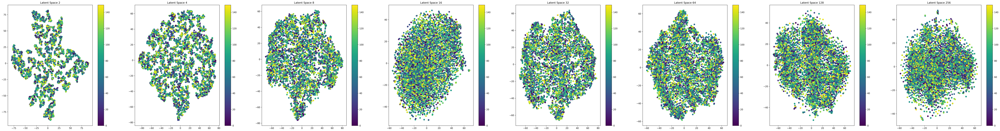

In [ ]:
# Plot Result
fig = plt.figure(figsize=(len(ae_models) * 10, 2 * 5), dpi=300)
for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):
    ax = plt.subplot(1, len(ae_models), i + 1)

    encoder_model = model.layers[1]
    latent_value = encoder_model.predict(train_images, batch_size=96, verbose=0)

    train_labels = np.array(list(map(lambda x: x[1], train_images))).flatten()

    if len(latent_value[0]) > 1:
        tsne = TSNE(n_components=2, init='pca', random_state=0, learning_rate='auto')
        latent_value = np.array(list(map(lambda x: x, latent_value)))
        X_tsne = tsne.fit_transform(latent_value)
        #X_tsne = list(map(lambda x: x, X_tsne))

        ax.title.set_text(str.format('Latent Space {0}', lantent_space))
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=train_labels)
        plt.colorbar()
    else:
        plt.scatter(latent_value[:, 0], np.zeros(len(latent_value)), c=train_labels)
        plt.colorbar()
plt.show(block=False)


## Latent Space Classification
If the data can be can be clustered with the latent space. That means that it should be possible perform image classification with the latent space.

In [ ]:
def plot_value_array(ax, i, predictions_array, true_label, nr_classes=10):
    true_label = true_label[i]
    ax.grid(False)
    ax.set(ylim=[0, 1])
    thisplot = ax.bar(range(nr_classes), predictions_array, color="#777777")
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')


In [ ]:
# Plot Classification Prediction Result
accu_evolutions = []

fig = plt.figure(figsize=(len(ae_models) * 10, 2 * 5), dpi=300)
outer = fig.add_gridspec(1, len(ae_models), wspace=0.05, hspace=0.2, left=0.03, right=0.98, bottom=0.03, top=0.98)
trainY = np.array(list(map(lambda x: x[1], train_images))).flatten()

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

    # Compute latent space.
    encoder_model = model.layers[1]
    latent_value = encoder_model.predict(trainAugmentedClassificationDS, batch_size=256, verbose=0)

    #
    neigh = KNeighborsClassifier(n_neighbors=7)
    neigh.fit(latent_value, trainY)
    prob = neigh.predict_proba(latent_value)

    # Compute accuracy
    result_classification = [np.argmax(_prob) for _prob in prob]
    correct_class = trainY == result_classification
    accu = correct_class.sum() / len(latent_value)
    accu_evolutions.append(accu)

    inner = outer[i].subgridspec(3, 3, wspace=0.02, hspace=0.02)

    ax = plt.Subplot(fig, outer[i])
    ax.set_title(str.format('Latent Space {0} - Probability {1}', lantent_space, accu))
    ax.axis('off')

    axs = inner.subplots()  # Create all subplots for the inner grid.
    for (c, d), ax in np.ndenumerate(axs):
        index = c * 3 + d
        plot_value_array(ax, index, prob[index], trainY, len(classes))


plt.show(block=False)


In [ ]:
for i, (lantent_space, accu) in enumerate(zip(latent_spaces, accu_evolutions)):
    print(str.format("Latent Space {0} - Accuracy {1}", lantent_space, accu))


Latent Space 2 - Accuracy 0.16541720990873532
Latent Space 4 - Accuracy 0.15759452411994784
Latent Space 8 - Accuracy 0.16900260756192959
Latent Space 16 - Accuracy 0.1590612777053455
Latent Space 32 - Accuracy 0.15498696219035202
Latent Space 64 - Accuracy 0.15759452411994784
Latent Space 128 - Accuracy 0.16020208604954367
Latent Space 256 - Accuracy 0.19426336375488917


## Transition Latent Space
This show if the latent space between two points are continuous.

In [ ]:
import scipy
import moviepy.editor

In [ ]:
def interpolate(zs, steps):
    out = []
    for i in range(len(zs)-1):
        for index in range(steps):
            fraction = index/float(steps)
            out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
    return out


In [ ]:
def generate_grid_image(model, latent_space, figsize=(8, 8), subplotsize=(3, 3)):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(latent_space, training=False)

    fig = plt.figure(figsize=figsize)
    for i in range(predictions.shape[0]):
        plt.subplot(subplotsize[0], subplotsize[1], i + 1)
        rgb = (predictions[i, :, :, 0:3] + 1.0) / 2.0
        plt.imshow(np.asarray(rgb))
        plt.axis('off')
    plt.close()
    return fig


In [ ]:

fps = 15
duration_sec = 5
smoothing_sec = 1.0
num_frames = 4 * fps

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

    encoder_model = model.layers[1]
    latent_value0 = encoder_model.predict(trainAugmentedAEDS.take(2), batch_size=9, verbose=0)

    latent_value1 = encoder_model.predict(trainAugmentedAEDS.skip(2).take(2), batch_size=9, verbose=0)

    nr_elemenets = 16

    all_latents = interpolate([latent_value0[0:16], latent_value1[0:16]], num_frames)

    def make_frame(t):
        frame_idx = int(np.clip(np.round(t * fps), 0, num_frames - 1))
        latents = all_latents[frame_idx]

        # Generate figure in respect new latent pace
        fig = generate_grid_image(model.layers[2], latents, (5, 5), (4, 4))

        # Convert figure to bitmap.
        fig.canvas.draw()
        data = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        return data

    gif_path_dir = os.path.join(root_dir, "autoencoder_pokemon_transition")
    
    if not os.path.exists(gif_path_dir):
        os.mkdir(gif_path_dir)

    gif_filepath = os.path.join(gif_path_dir, 'latent_transition_grid_I{0}.gif'.format(lantent_space))
    video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
    video_clip.write_gif(gif_filepath, fps=fps)


2023-03-29 16:18:46.495658: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.21GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-03-29 16:18:46.495687: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.21GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I2.gif with imageio.


2023-03-29 16:19:35.311141: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.27GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-03-29 16:19:35.311203: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.27GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-03-29 16:19:35.311215: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.41GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-03-29 16:19:35.311222: W tensorflow/core/common_runtime/bfc_allocato

MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I4.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I8.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I16.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I32.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I64.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I128.gif with imageio.


MoviePy - Building file result/pokemon_classification_vs_dim_reduction/autoencoder_pokemon_transition/latent_transition_grid_I256.gif with imageio.
